<a href="https://colab.research.google.com/github/JackelinneSC/ImageClassificationModel/blob/main/ImgClassification_Fruits%26Veggies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Fruit and vegetable image recognition- Learning vocabulary in spanish
This notebook builds an end-to-end multiclass image classifier using TensorFlow 2.0 and TensorFlow hub.

## Problem definition:
Identify a the name of the fruit or vegetable given an image of a fruit or vegetable. Then provide the spanish version of the word to help kids learn vocabulary in spanish.

## Data
The data used for this project is provided from Kaggle's Fruits and Vegetables Image Recognition Dataset: A dataset of images containing fruits and vegetables, Version 2020. Images from the dataset Fruits 360 version 2020.05.18.0 were used to feed more images to the model.
Fruits and vegetables for image recognition dataset: https://www.kaggle.com/kritikseth/fruit-and-vegetable-image-recognition.
License: 
  CC0: Public Domain

Fruits 360 dataset: https://www.kaggle.com/moltean/fruits?select=fruits-360-original-size 
License: 
  CC BY-SA 4.0

## Evaluation 
The evaluation will use categorical crossentropy. This is a loss function that is used in multi-class classification tasks.

## Features

Information about the data:

* The data ara images, which are considered unstructured data. Therefore, is best to use deep learning/ transfer learning.
* There are 36 classes of fruits and vegetables. The total number of images is 4,320.
* The training set contains 3565 images. One fruit or vegetable per image (labeled).
* The validation set contains 351 images. One fruit or vegetable per image (labeled).
* The test set contains 356 images. One fruit or vegetable per image. (Not labeled because the model should predict them).


Clone github repository

In [ ]:
!git clone https://github.com/JackelinneSC/ImageClassification-C964.git

Open Google Drive

-- Authenticatio credentials are in written document

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Download modules

In [ ]:
# Import the libriries for this projec
import tensorflow as tf
import tensorflow_hub as hub

# libraries to handle the data
import pandas as pd
import numpy as np

# Libraries to preprocess images
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing import image


#Libraries to visualize the data
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import matplotlib.pyplot as plt

# Model evaluation 
from sklearn.metrics import confusion_matrix, classification_report

#Libraries to split the data 
from sklearn.model_selection import train_test_split

# Libraries to build TensorBoard callbacks
import datetime

# Librarie to translate prediction to spanish
from bs4 import BeautifulSoup
import requests

# libraries to handle directory folders
import os
import pathlib as Path
import os.path
import glob

In [ ]:
print("TF version:", tf.__version__)
print("TF Hub version:" , hub.__version__)

# Check for GPU availability
print("GPU","available (YES!)" if tf.config.list_physical_devices("GPU")else "not available :(")

TF version: 2.8.0
TF Hub version: 0.12.0
GPU available (YES!)


## Getting the data ready

* Unzip dataset folder
* Get images filepaths
* Create dataframes to handel data.
* Graph count images per class of the train set.


In [ ]:
# Unzip dataset Fruit and vegetables for image classification
# !unzip "drive/MyDrive/ImageClassification/Dataset/archive.zip" -d "drive/MyDrive/ImageClassification/Dataset/"

### Read filenames

* Obtain filepaths for training, validation and test folders and save it as a list of filepaths.
* Create dataframe for each dataset.
* Plot each dataset.

In [ ]:
# Create filepaths for training set
training_dir = "drive/MyDrive/ImageClassification/Dataset/train/**/*.*"
training_filepaths =glob.glob(training_dir, recursive = True)


In [ ]:
# Create filepaths for test set
test_dir = "drive/MyDrive/ImageClassification/Dataset/test/**/*.*"
test_filepaths =glob.glob(test_dir, recursive = True)


In [ ]:
# Create filepaths for validation set
validation_dir = "drive/MyDrive/ImageClassification/Dataset/validation/**/*.*"
validation_filepaths =glob.glob(validation_dir, recursive = True)

In [ ]:
 # Function to creates dataframes of filepaths and labels to manipulate our data
def create_dataframe(filepath):
  """
  Creates and returns a DataFrame of the filepaths and labels retrieved from the dataset.
  Does not contain unique labels.
  
  :param str list: A list of strings containig all the images filepaths from the dataset.
  """
  labels = [str(filepath[i]).split("/")[-2] \
            for i in range(len(filepath))]

 
  filepath = pd.Series(filepath, name='Filenames').astype(str)
  labels= pd.Series(labels, name='Label')

  # Concatenate filepaths and labels
  df = pd.concat([filepath, labels],axis=1)

  # Shuffle tahe dataframe and reset index
  df = df.sample(frac=1).reset_index(drop =True)

  return df

In [ ]:
# Function to obtain information about the data sets
def get_dataframe_desc(dataframe):
  """
  Prints a the total of pictures, total of unique labels and an array of the unique labels.
  """
  print('Description:\n')
  print(f'Number of pictures: {dataframe.shape[0]}\n')
  print(f'Number of labels: {len(dataframe.Label.unique())}\n')
  print(f'Labels: {dataframe.Label.unique()}')

In [ ]:
# Create dataframes of training and test datas
training_df = create_dataframe(training_filepaths)
test_df = create_dataframe(test_filepaths)
validation_df = create_dataframe(validation_filepaths)

Description of the data


In [ ]:
# Provides a description of the training, validation and test datasets.
get_dataframe_desc(training_df)
get_dataframe_desc(test_df)
get_dataframe_desc(validation_df)

Description:

Number of pictures: 3565

Number of labels: 36

Labels: ['mango' 'garlic' 'pomegranate' 'sweetpotato' 'bell pepper' 'ginger'
 'kiwi' 'pear' 'cabbage' 'cauliflower' 'jalepeno' 'capsicum' 'pineapple'
 'banana' 'eggplant' 'grapes' 'onion' 'lemon' 'orange' 'carrot'
 'sweetcorn' 'chili pepper' 'peas' 'soybeans' 'turnip' 'paprika' 'lettuce'
 'potato' 'beetroot' 'apple' 'cucumber' 'watermelon' 'raddish' 'spinach'
 'corn' 'tomato']
Description:

Number of pictures: 359

Number of labels: 36

Labels: ['lettuce' 'kiwi' 'pomegranate' 'peas' 'banana' 'capsicum' 'cabbage'
 'corn' 'sweetcorn' 'ginger' 'beetroot' 'spinach' 'pineapple' 'cucumber'
 'turnip' 'pear' 'carrot' 'chili pepper' 'lemon' 'apple' 'bell pepper'
 'onion' 'potato' 'cauliflower' 'grapes' 'sweetpotato' 'soybeans'
 'raddish' 'eggplant' 'garlic' 'orange' 'paprika' 'jalepeno' 'watermelon'
 'tomato' 'mango']
Description:

Number of pictures: 351

Number of labels: 36

Labels: ['garlic' 'cabbage' 'eggplant' 'cauliflower' 'pe

### Get unique labels and filepaths for training and validation set.

* Find unique labels and turn them into boolean array.
* Obtain filenames of each image in the training and validation set.


In [ ]:
# Find the unique label values from the training set
labels_training = training_df["Label"].to_numpy()
unique_labels =np.unique(labels_training)
# Save labels for studying purposes
if os.path.isfile("drive/MyDrive/ImageClassification/Dataset/labels.csv"):
  # file exists
  np.savetxt("drive/MyDrive/ImageClassification/Dataset/labels.csv", unique_labels, delimiter=",", fmt="%s")
else:
  np.savetxt("drive/MyDrive/ImageClassification/Dataset/labels.csv", unique_labels, delimiter=",", fmt="%s")


In [ ]:
# Turn every label into a boolean array in the trainin set
boolean_labels_training = [label == unique_labels for label in labels_training ]

In [ ]:
# Create pathnames from image ID's from the training set
filenames_training = [fname for fname in training_df["Filenames"]]

In [ ]:
# Find the unique label values in the validation set
labels_validation = validation_df["Label"].to_numpy()
unique_labels_validation =np.unique(labels_validation)

In [ ]:
# Turn every label into a boolean array in the validation set
boolean_labels_validation = [label == unique_labels_validation for label in labels_validation ]

In [ ]:
# Create pathnames from image ID's from the training set
filenames_validation = [fname for fname in validation_df["Filenames"]]

## Visualize training and test data sets.

Bar chart and pie chart of the training set.

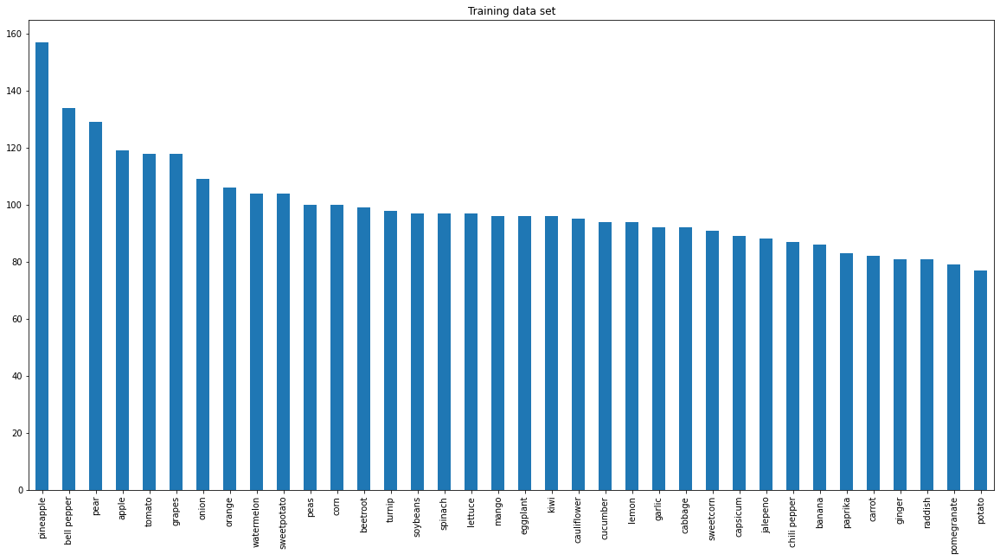

In [ ]:
# Plot the amount of images per label for training dataframe
training_df["Label"].value_counts().plot.bar(figsize=(20,10), title="Training data set").get_figure().savefig("BarChart-TrainingSet.png");



Percentage of images per class included in the train set.

In [ ]:
# function to create pie chart with percentages of each class 
def create_pie_chart(dataframe, suffix="Dataset"):
  labels, sizes = np.unique(dataframe["Label"], return_counts=True)
  fig1, ax1 = plt.subplots()
  box = ax1.get_position()
  ax1.set_position([box.x0, box.y0, box.width * 2.3, box.height* 2.8])

  ax1.pie(sizes, labels=labels, shadow=True, startangle=90)

  ax1.axis('equal')
  total = sum(sizes)
  plt.legend(
      loc='upper left',
      labels=['%s, %1.1f%%' % (
          l, (float(s) / total) * 100) for l, s in zip(labels, sizes)],
      prop={'size': 15},
      bbox_to_anchor=(0.1, 0.4),
      bbox_transform=fig1.transFigure
  )
  plt.title("Percentage of images per class in "+ suffix + ".\n", bbox={'facecolor':'0.8', 'pad':1})
  plt.show()
  # Save figure
  fig1.savefig('PieChart-' + suffix + '.png')

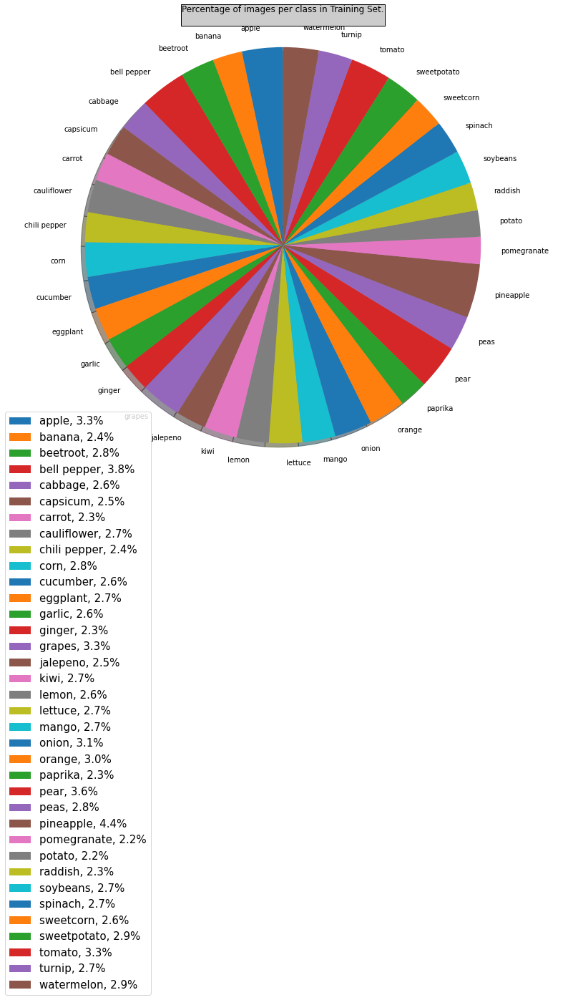

In [ ]:
# Get pie chart for training set
create_pie_chart(training_df, suffix="Training Set")

Visualize data in test data set.

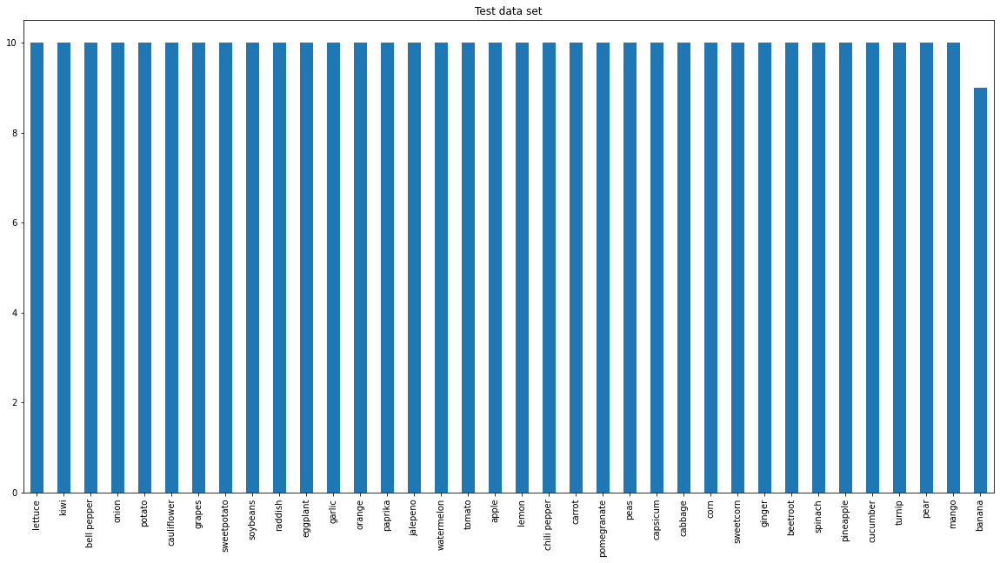

In [ ]:
# Plot the amount of images per label for training dataframe
test_df["Label"].value_counts().plot.bar(figsize=(20,10), title="Test data set").get_figure().savefig("BarChart-TestSet.png");



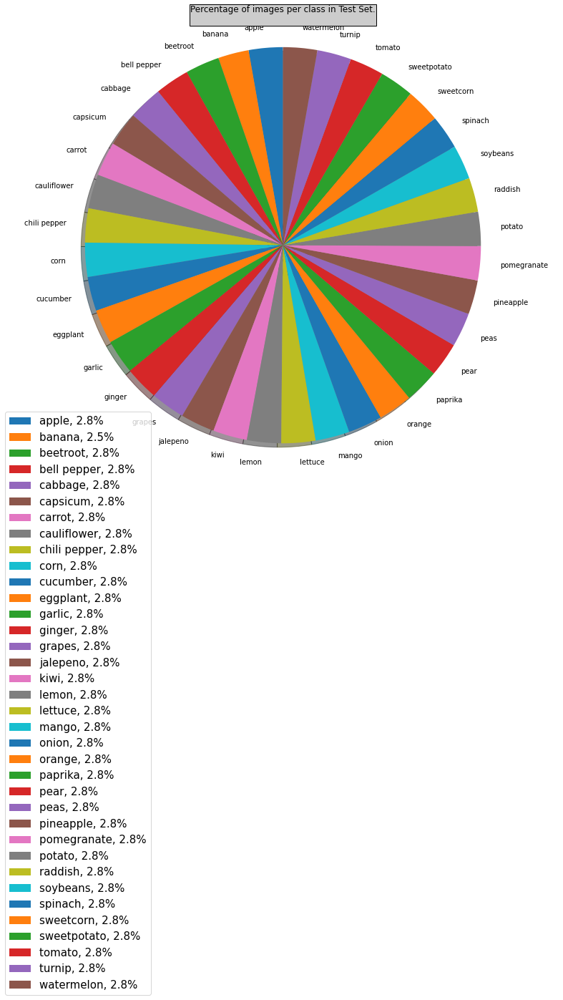

In [ ]:
# Get pie chart for training set
create_pie_chart(test_df, suffix="Test Set")

## Prepare data to train model


In [ ]:
# Setup X & Y variables
X_train =filenames_training
y_train = boolean_labels_training
X_val = filenames_validation
y_val =boolean_labels_validation

## Preprocessing images (turning images into tensors)
  

To preprocess our images into Tensors we're going to write a funtion which does a few things:
1. Take an image filepath as an input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224).
6. Return the modified `image`.

In [ ]:
# Define image size
IMG_SIZE = 224
# Function to preprocess an image
def process_image(image_path, img_size =IMG_SIZE):
  """
  Turns the image into a Tensor.

  :param str image_path: image filepath
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image= tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size=[IMG_SIZE, IMG_SIZE ])        

  return image      

### Turn the data into batches

TensorFlow requires data in the form of batches. A batch is a small portion of the data with a default size 32.
Furthermore, in order to use TensorFlow effectively, we need the data in the form of (image,label).
Image in the form of a Tensor.

In [ ]:

# Function that returns a tuple (image,tuple)
def get_image_label_tuple(image_path, label):
  """
  Takes an image file path name an the associated label. Then, it processes the image to convert it into Tensor. 
  Finally returns the tuple (image,label).
  """
  image = process_image(image_path)
  return image,label

In [ ]:
# Define batch size
BATCH_SIZE = 32
# Function to turn our data into batches
def data_to_batch(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates a batch of data out of an image (X) and label (y) pairs.
  If it's training data, then it shuffles it.
  If it's validation data, then it does not shuffle it.
  If it's test data, it must not have label.
  """

  # if the data is the test set, there is no labels
  if test_data:
    print("Creating test data batches")
    data= tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if ihe data is the valid set, the data is not shuffled
  elif valid_data:
    print("creating valid data batches")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label_tuple).batch(BATCH_SIZE) # creates the tuple with the image preprocessed
    return data_batch

  else:
    # It is training data
    print("Creating training data batches")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels

    # Shuffle filepaths and lables before mapping function 'process_image()'
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label_tuple)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
training_data = data_to_batch(X_train, y_train)
validation_data = data_to_batch(X_val, y_val, valid_data=True)
# check out the different attributes of our data batches
training_data.element_spec, validation_data.element_spec

Creating training data batches
creating valid data batches


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 36), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 36), dtype=tf.bool, name=None)))

### Visualize images from Data Batches


In [ ]:
# Function to view images from data batches
def show_25_images(images, labels):
  """
  Displays a subset of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(20,20))
  for i in range(25):
    # create subplot 5x5
    ax = plt.subplot(5,5,i +1)
    # Display image
    plt.imshow(images[i])
    # Display label
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

### Visualize training data

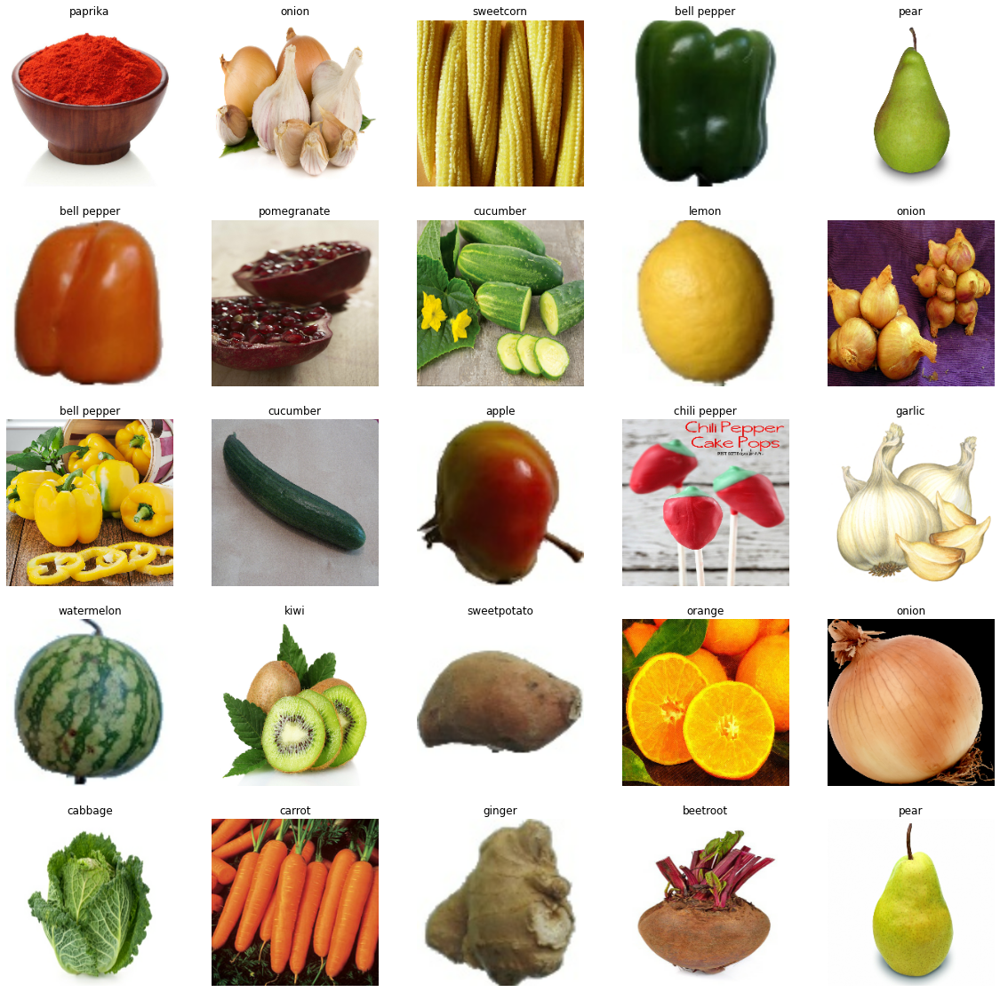

In [ ]:
# Extract training images with labels to visualize
training_images, training_labels = next(training_data.as_numpy_iterator())
show_25_images(training_images, training_labels)

### Visualize validation data

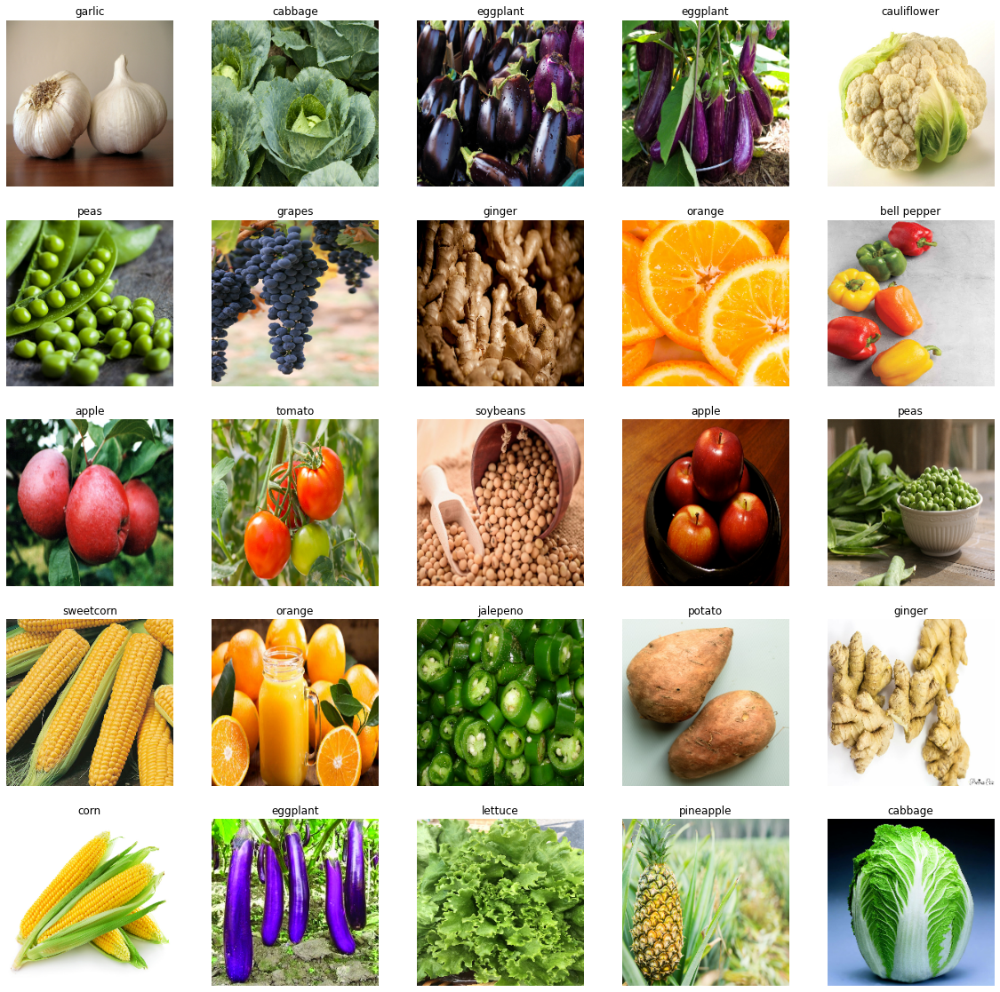

In [ ]:
# Extract validation images with labels to visualizae
validation_images, validation_labels = next(validation_data.as_numpy_iterator())
show_25_images(validation_images, validation_labels)

## Building a model

Requirements:

* Define input shape (the images shape, in the form of tensors) for the model.
* Define output shape (image labels, in the form of tensors) for the model.
* The URL of the model we want to use - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Define input shape in the form of [batch, height, width, color channels]
INPUT_SHAPE =[None, IMG_SIZE, IMG_SIZE, 3]
# Define output shape
OUTPUT_SHAPE = len(unique_labels)
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Use Keras deep learning model

# 1. Function that builds Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url= MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # 1.1 Setup keras model
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,# Layer 2
                                                     activation="softmax")
                               
  ])

  # 1.2 Compile model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics =["accuracy"]
  )

  # 1.3 Build model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
# Create a function to save model
def save_model(model, suffix = None):
  """
  Saves a model in a models directory and appends a suffix string.
  """
  # Path directory
  path= "drive/MyDrive/ImageClassification/models"
  # create a model directory pathname with current time
  modeldir = os.path.join(path,
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  
  model_path = modeldir + "-" + suffix + ".h5" #Format model
  print(f'Saving model to:  {model_path}')
  model.save(model_path)
  return model_path

In [ ]:
# Function to load model
def load_model(model_path):
  """
  Loads a sved model from a specific path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

### Create model to use with the training set.

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 36)                36072     
                                                                 
Total params: 5,468,785
Trainable params: 36,072
Non-trainable params: 5,432,713
_________________________________________________________________


### Create callbacks for the model

* A TensorBoard Callback
* An early stopping callback to prevent our model from training for too long

In [ ]:
# Load tensorboard notebook extensions
%load_ext tensorboard

In [ ]:
# Resets the logs file. 
# !rm -rf drive/MyDrive/ImageClassification/logs

In [ ]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  """
  Tensorboard callback helps track the model.
  """
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/ImageClassification/logs",
                        #Create a datetime to tracked the logs
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Create a  early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience =3)

### Train a model with full set of data.

Define number of epochs are the amount of data I will pass to the model.

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10,max:100}

In [ ]:
# Create a function to train and return a trained model
def train_model():
  """
  This function trains a given model and returns the trained version.
  """

  # Create a model 
  model = create_model()

  ## Create a new tensorboard session everytime we train a model.
  tensorboard = create_tensorboard_callback()
  # Fit the model to the data passing it the callbacks
  model.fit(x=training_data,
            epochs = NUM_EPOCHS,
            validation_data = validation_data,
            validation_freq =1,
            callbacks = [tensorboard, early_stopping])
  
  # Return fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

112/112 [==============================] - 114s 1s/step - loss: 0.0711 - accuracy: 0.9829 - val_loss: 0.1220 - val_accuracy: 0.9658
Epoch 12/100
112/112 [==============================] - 115s 1s/step - loss: 0.0664 - accuracy: 0.9820 - val_loss: 0.1247 - val_accuracy: 0.9630


### Graphs to visualize the history of network learning: accuracy and loss.

The TensorBoard function will access the logs directory created to measure loss and accuracy of each epoch when training the model.

In [ ]:
%tensorboard --logdir drive/MyDrive/ImageClassification/logs

<IPython.core.display.Javascript object>

Make predictions on validation data.

In [ ]:
# Make a prediction on the validation data (not used to train the model)
predictions = model.predict(validation_data, verbose=1)
predictions

11/11 [==============================] - 15s 1s/step


array([[4.7439620e-08, 6.8406513e-07, 2.0503847e-10, ..., 4.4440117e-08,
        2.6892988e-07, 6.0894250e-09],
       [1.6132994e-07, 1.4808626e-06, 9.3854569e-06, ..., 2.7429635e-06,
        1.0226053e-05, 2.7013508e-05],
       [6.5976172e-07, 2.1182428e-05, 1.2262075e-06, ..., 7.5404161e-05,
        9.4647439e-06, 1.2985415e-06],
       ...,
       [1.7416706e-07, 2.1132477e-07, 2.5082722e-06, ..., 1.6047991e-07,
        1.0599772e-05, 1.9081993e-07],
       [7.6738761e-05, 4.1583242e-08, 8.8172976e-04, ..., 5.6818291e-05,
        8.6939772e-06, 1.0848361e-06],
       [2.2179181e-09, 1.5546864e-05, 2.4258388e-05, ..., 1.1214306e-05,
        5.4114127e-05, 1.3483001e-05]], dtype=float32)

Test Score on the validation data


In [ ]:
test_score = model.evaluate(validation_data)

print("[INFO] accuracy: {:.2f}%".format(test_score[1] * 100)) 
print("[INFO] Loss: ",test_score[0])

11/11 [==============================] - 14s 1s/step - loss: 0.1247 - accuracy: 0.9630
[INFO] accuracy: 96.30%
[INFO] Loss:  0.12468884885311127


Transform predictions to text

In [ ]:
# Turn prediction probabilities into their respective lable
def get_predicted_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_labels[np.argmax(prediction_probabilities)]

In [ ]:
# Create a function to unbatch a batch dataset with labels
def unbatchify(batch_data, has_labels = True):
  """
  Takes a batched dataset of (image,label) Tensors. The it returns separate arrays images and labels.
  """
  images=[]
  labels =[]

  if has_labels:
    # Loop through unbatched data
    for image, label in batch_data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(unique_labels[np.argmax(label)])
    return images, labels
  else:
    for image in batch_data.unbatch().as_numpy_iterator():
      images.append(image)
    
    return images




 

In [ ]:
# Unbatchify the validation data
validation_images_unbatch, validation_labels_unbatch = unbatchify(validation_data,
                                                                  has_labels= True)

### Plot predictions from validation set

In [ ]:
# Function to plot predictions made by the model
def plot_predictions(predicted_probabilites, labels, images, n=1):
  """
  View one image predicted by the model.
   
  @param n : number of the index 
  """
  pred_prob, label, image = predicted_probabilites[n], labels[n], images[n]

  # Get the predicted labels
  pred_label = get_predicted_label(pred_prob)
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == label:
    color = "green"
  else:
    color ="red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}". format(pred_label,
                                      np.max(pred_prob) *100,
                                      label),
                                     color = color)

In [ ]:
# Function to plot top 10 predictions made by the model
def plot_top10_predictions(predicted_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the accurate label for sample n.

  """
  pred_prob, true_label = predicted_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_predicted_label(pred_prob)

  # Find indexes
  top_10_indexes = pred_prob.argsort()[-10:][::-1]
  # Find top 10 predicted values
  top_10_predicted_values = pred_prob[top_10_indexes]
  # find the top 10 predicted values' labels
  top_10_labels = unique_labels[top_10_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_labels)),
                     top_10_predicted_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_labels)),
             labels= top_10_labels,
             rotation = "vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_labels):
    top_plot[np.argmax(top_10_labels == true_label)].set_color("green")
  else:
      pass


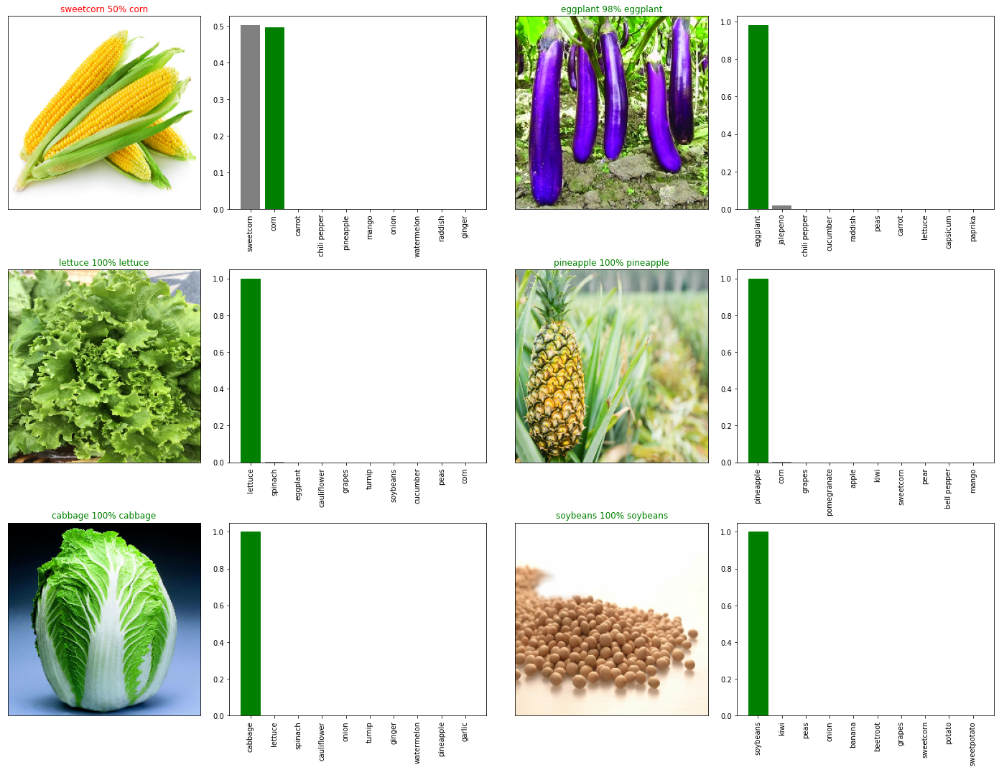

In [ ]:
# Check out a few predictions and their differet values
i_multiplier = 20
num_rows= 3
num_cols =2
num_images= num_rows* num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_predictions(predicted_probabilites=predictions,
            labels = validation_labels_unbatch,
            images = validation_images_unbatch,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_top10_predictions(predicted_probabilities=predictions,
                 labels = validation_labels_unbatch,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad =1.0)

plt.show()

## Save and reload trained model

In [ ]:
# save model trained on 1000 images
save_model(model, suffix="full-imagesv3-mobilenetv2-Adam")

Saving model to:  drive/MyDrive/ImageClassification/models/20220317-18301647541833-full-imagesv3-mobilenetv2-Adam.h5


'drive/MyDrive/ImageClassification/models/20220317-18301647541833-full-imagesv3-mobilenetv2-Adam.h5'

## Making predictions on test data

In [ ]:
# Turn test data into batches
test_data = data_to_batch(test_filepaths, test_data= True)

Creating test data batches


In [ ]:
# Load model trained with full dataset.
load_full_model = load_model("/content/drive/MyDrive/ImageClassification/models/20220317-18301647541833-full-imagesv3-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/ImageClassification/models/20220317-18301647541833-full-imagesv3-mobilenetv2-Adam.h5


In [ ]:
# Make predictions on test dataset using loaded full model
test_predictions =  load_full_model.predict(test_data,
                                             verbose=1)

12/12 [==============================] - 56s 4s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("drive/MyDrive/ImageClassification/preds_arrayv3.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/ImageClassification/preds_arrayv3.csv", delimiter=",")

###Visualize the history of network learning for testing data in confusion matrix.

In [ ]:
# Process images from the test dataset to create confusion matrix
from keras.preprocessing.image import ImageDataGenerator
dir ="drive/MyDrive/ImageClassification/Dataset/test/"
testing_datagen = ImageDataGenerator(rescale=1. / 255)
testing_generator = testing_datagen.flow_from_directory(
  dir,
  target_size=(IMG_SIZE, IMG_SIZE),
  batch_size=BATCH_SIZE,
  shuffle=False,
  class_mode='categorical')


Found 359 images belonging to 36 classes.


In [ ]:
# Process images from the train dataset to create confusion matrix
dir ="drive/MyDrive/ImageClassification/Dataset/train/"
train_datagen = ImageDataGenerator(rescale=1. / 255)
train_generator = train_datagen.flow_from_directory(
    dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical')

Found 3565 images belonging to 36 classes.


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Confusion Matrix
Normalized confusion matrix
Classification Report
              precision    recall  f1-score   support

       apple       0.89      0.80      0.84        10
      banana       1.00      0.78      0.88         9
    beetroot       1.00      1.00      1.00        10
 bell pepper       0.83      1.00      0.91        10
     cabbage       1.00      1.00      1.00        10
    capsicum       1.00      0.70      0.82        10
      carrot       1.00      0.90      0.95        10
 cauliflower       1.00      1.00      1.00        10
chili pepper       1.00      1.00      1.00        10
        corn       0.89      0.80      0.84        10
    cucumber       1.00      1.00      1.00        10
    eggplant       1.00      1.00      1.00        10
      garlic       1.00      1.00      1.00        10
      ginger       1.00      1.00      1.00        10
      grapes       1.00      1.00      1.00        10
    jalepeno       0.91      1.00      0.95        10
        kiwi  

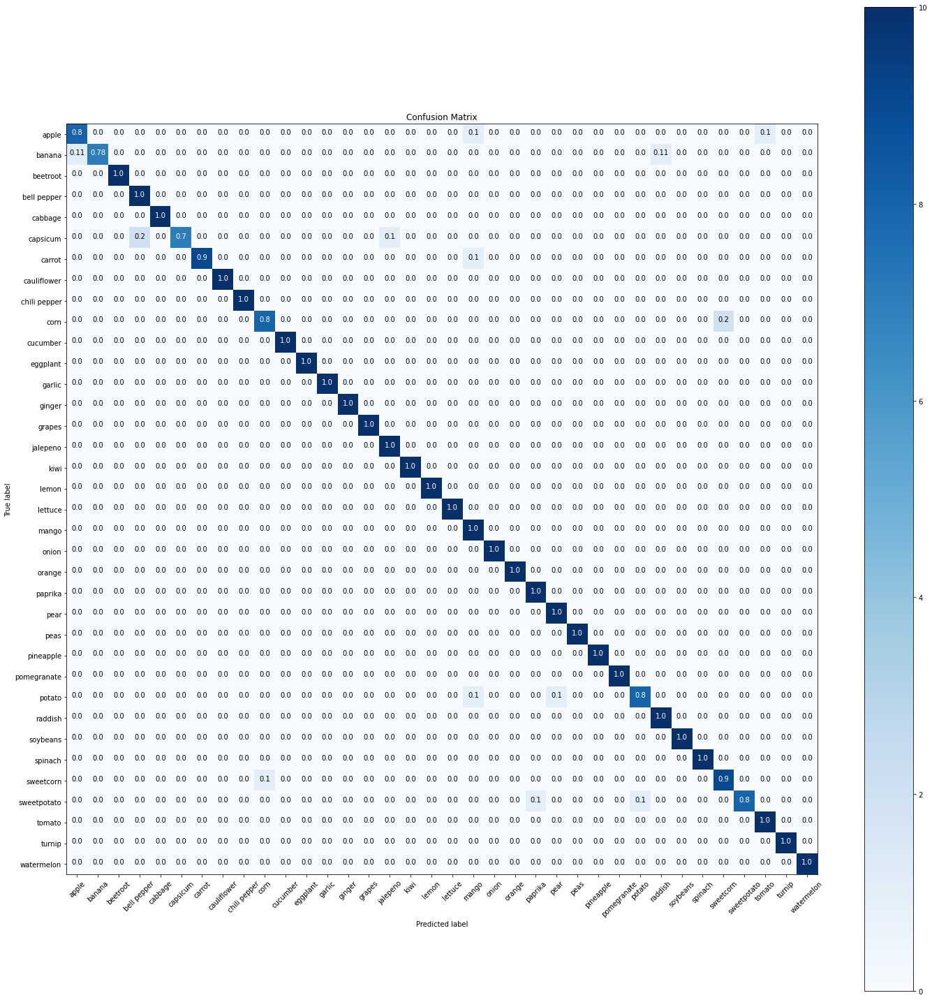

In [ ]:
#Plot the confusion matrix. Set Normalize = True/False
def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.around(cm, decimals=2)
        cm[np.isnan(cm)] = 0.0
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

#Print the Target names
from sklearn.metrics import classification_report, confusion_matrix
import itertools 

#Confusion Matrix 
target_names = []
for key in train_generator.class_indices:
    target_names.append(key)

predictions = load_full_model.predict(testing_generator)
predictions = np.argmax(predictions, axis=1)
print('Confusion Matrix')
cm = confusion_matrix(testing_generator.classes, predictions)
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')

#Print Classification Report
print('Classification Report')
print(classification_report(testing_generator.classes, predictions, target_names=target_names))

## Predict user inputs. Translate fruits and vegetables from English to Spanish

To make predictions on custom images, we'll:
* Get the filepaths of the image.
* Turn the filepaths into data batches using create_data_batches(). Set test_data to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted label to the custom images.
* Transalte the image name into Spanish.


Install package "Google Transalate API for python 2.7 and 3.x". This package is used to translate the labels from English to Spanish

In [ ]:
pip install mtranslate

  Created wheel for mtranslate: filename=mtranslate-1.8-py3-none-any.whl size=3695 sha256=31ebbd00537c94907972a6a7c7277faa7d72e44058b847b9b13200f58d2c3aa3
  Stored in directory: /root/.cache/pip/wheels/a4/5d/18/6ea549ba042f5f29728049065bdc8a5cdb3c88a413bb026c9a
Successfully built mtranslate


In [ ]:
from mtranslate import translate


In [ ]:
# Predict label of the custom images uploaded by the user
def predict_custom_image(custom_data):
  """
  Predicts the label of an image. 
  Parameter: location of the image.
  """
  # Predict label
  custom_pred = load_full_model.predict(custom_data)
  # Get custom image prediction labels
  custom_pred_labels =[get_predicted_label(custom_pred[i]) for i in range(len(custom_pred))]

  return custom_pred_labels

In [ ]:
# Function to translate images uploaded by the user
def translate_images(custom_images,predicted_labels):
  for j in range(0,len(custom_images)):
    try:
      img = custom_images[j]
      plt.figure(1, figsize=(10,10)); plt.clf()
      plt.imshow(img)
      spanish =translate(predicted_labels[j], "es", "en")
      fontsize = 30
      plt.title("English: {} - Spanish:{}".format(predicted_labels[j],
                                                  spanish), fontdict={'fontsize': fontsize})
      plt.pause(1)
    except:
      print("An exception occured.")

In [ ]:
# Function to turn user input into the correct data format
def process_user_input(user_input):
  custom_dir =[user_input]
  # Turn custom data into batch
  custom_data = data_to_batch(custom_dir, test_data=True)
  # make a prediction in custom image batch and returns label
  custom_pred_label = predict_custom_image(custom_data)
  # Transalate images uploaded by the user
  custom_images = unbatchify(custom_data, has_labels= False)
  
  translate_images(custom_images, custom_pred_label)


### User can upload image from the system.

User can copy the image path from the custom image folder to try the model.

Enter the path of your file: /content/drive/MyDrive/ImageClassification/online_images/image_1.jpg
Creating test data batches


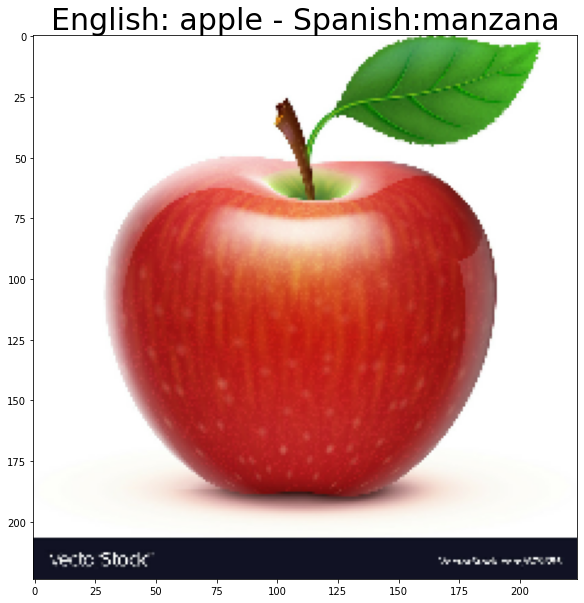

In [ ]:
import sys
import os

user_input = input("Enter the path of your file: ")
try:
  if os.path.exists(user_input): 
    # File exists
    process_user_input(user_input)
    
except:
  print("The file does not exist in the following path: "+str(user_input))

### The user can upload images from the internet. 

The user needs to provide a valid image url.



In [ ]:
import requests
def is_url_image(image_url, i):
  try:
    # It's an url
    image_formats = ("image/png", "image/jpeg", "image/jpg")
    r = requests.head(image_url)
    if r.headers["content-type"] in image_formats:
      # Local directory
      local_dir = "/content/drive/MyDrive/ImageClassification/online_images/";
      # File exists and is an image
      img_data = requests.get(image_url).content
    
      with open(local_dir + 'image_' + str(i)+'.jpg', 'wb') as handler:
          handler.write(img_data)
      process_user_input(local_dir + 'image_' + str(i) +'.jpg')
    else:
      # The url iis not an image.
      print("The url you provided is not an image. Please enter the URL of an image.")

  except:
    print("Please enter a valid URL.")
   
      
   

Enter the path of your file: https://media.istockphoto.com/photos/raw-potatoes-with-slices-picture-id496359598?b=1&k=20&m=496359598&s=170667a&w=0&h=obOXxUguEsuCok-7cHf6qOMhw-f8Bp06PKRRAqdASDc=
Creating test data batches


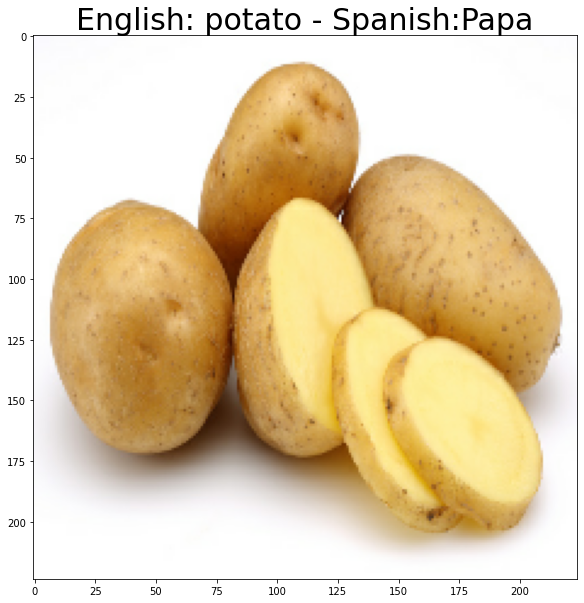

In [ ]:

user_input = input("Enter the path of your file: ")
is_url_image(user_input, i =8)